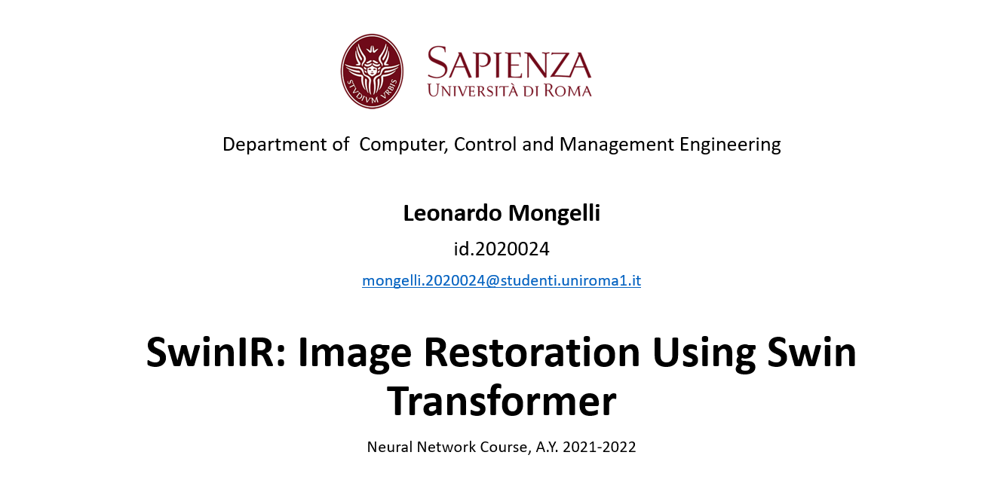

This project is a re-implementation of the work of *Jingyun Liang*, *Jiezhang Cao*, *Guolei Sun*, *Kai Zhang*, *Luc Van Gool* and *Radu Timofte*. The official PyTorch implementation of SwinIR: Image Restoration Using Shifted Window Transformer is available here: https://github.com/JingyunLiang/SwinIR


The entire work is based on the following arXiv paper: https://arxiv.org/abs/2108.10257v1



############################################################################################
###########################################   **INTRODUCTION**   ####################################
############################################################################################

**Image restoration** is a long-standing low-level vision problem that aims to **restore high-quality images from low-quality images** (e.g., downscaled, noisy and compressed images).

In this paper it was proposed a strong baseline model SwinIR for image restoration based on the Swin Transformer. **SwinIR is characterized by three parts:** **shallow feature extraction, deep feature extraction and high-quality image reconstruction**. The deep feature extraction module is composed of several residual Swin Transformer blocks (RSTB), each of which has several Swin Transformer layers together with a residual connection.

The experiments were done over **different tasks**: 


1.   image super-resolution classical
2.   image super-resolution lightweight
3.   image super-resolution real-world
4.   grayscale image denoising
5.   color image denoising
6.   JPEG compression artifact reduction



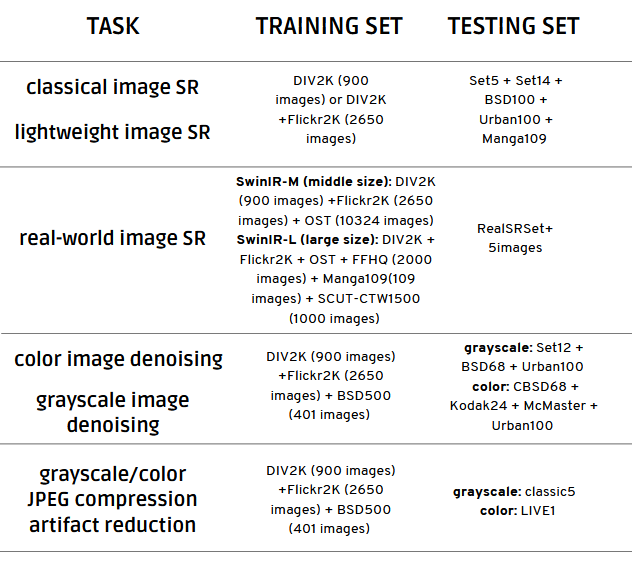

#Initial setup
Before start, make sure that you choose
* Runtime Type = Python 3
* Hardware Accelerator = GPU
* Browser != Firefox

in the **Runtime** menu -> **Change runtime type**

Then mount Google Drive and set up the environment.

In [ ]:
# Mount Google Drive
from google.colab import drive  # import drive from google colab

ROOT = "/content/drive"  # default location for the drive

drive.mount(ROOT)  # we mount the google drive at /content/drive

Mounted at /content/drive


The relevant files for the implementation are the following:

/content/drive/MyDrive/SwinIR_project/main_train_psnr.py

/content/drive/MyDrive/SwinIR_project/main_train_gan.py

/content/drive/MyDrive/SwinIR_project/main_test_swinir.py

/content/drive/MyDrive/SwinIR_project/models/network_swinir.py

/content/drive/MyDrive/SwinIR_project/options/swinir folder


In [ ]:
%cd ./drive/MyDrive/SwinIR_project/

/content/drive/MyDrive/SwinIR_project


Do installations and imports

In [ ]:
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirement.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 172 kB 4.7 MB/s 
     |████████████████████████████████| 5.9 MB 52.8 MB/s 
     |████████████████████████████████| 190 kB 78.0 MB/s 
  Created wheel for basicsr: filename=basicsr-1.4.2-py3-none-any.whl size=214838 sha256=58bce6c898d11b41d9c22746c6211d2de782b7025bf1a879ae26615c23786f3d
  Stored in directory: /root/.cache/pip/wheels/2c/b3/4a/e2bc545f98417b6766ca50dd82b2a1f2b37780c68d41da9ca9
Successfully built basicsr
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 59 kB 3.3 MB/s 
     |████████████████████████████████| 177 kB 8.6 MB/s 
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110474 sha256=09be41e290926435a1756e8ff34112be2f6c27bbc974e59b773bcefab9cc2602
  Stored in directory: /root/.cache/pip/wheels/ce/e0/ee/a2b3c5caab3418c1cc

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 53 kB 1.2 MB/s 
     |████████████████████████████████| 108 kB 8.8 MB/s 
     |████████████████████████████████| 509 kB 54.1 MB/s 


In [ ]:
import torch
import torchvision
print(torch.__version__)
print(torchvision.__version__)

1.12.1+cu113
0.13.1+cu113


In [ ]:
!pip install torch==1.12.1+cu113 torchvision==0.13.1+cu113 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [ ]:
torch.cuda.empty_cache()

In [ ]:
import os
import glob
import shutil

# test SwinIR by partioning the image into patches
test_patch_wise = False

# utils for visualization
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from skimage import io

# 2. Prepare datasets

Upload the images to be processed by SwinIR

**NOTICE:**  THIS STEPS CAN BE SKIPPED. THEY WERE ALREADY DONE AND THE DATASETS ARE ALREADY PRESENT IN THE PUBLIC FOLDER IN GOOGLE DRIVE 

Here you can find the entire procedure to prepare the datasets

##Download training datasets

In [ ]:
%cd trainsets/trainH
%ls

/content/drive/MyDrive/SwinIR_project/trainsets/trainH
DIV2K/  DIV2K.tar  Flickr2K/  README.md


###DIV2K dataset

DIV2K dataset extraction

In [ ]:
!tar -xvf "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K.tar" -C "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K/"     #[run this cell to extract tar files]

Output streaming troncato alle ultime 5000 righe.
DIV2K/DIV2K_train_LR_bicubic/X2/0001x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0208x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0338x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0337x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0785x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0665x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0121x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0587x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0385x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0358x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0865x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0356x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0331x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0003x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0518x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0536x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0233x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0677x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0217x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0169x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0543x2.png
DIV2K/DIV2K_train_LR_bicubic/X2/0004x2.png
DIV2

In [ ]:
!rm -rf DIV2K.tar

###DIV2K+FLICKR2K+OST dataset

Preparation of the dataset containing DIV2K+FLICKR2K+OST

PROCEDURE: unzip the zip folders, copy the images into DIV_FLICKR_OST folder,remove zip file. Sometimes I have also done a check to see if a random image of the new uploaded dataset is contained correctly in DIV_FLICKR_OST folder

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/animal.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/animal.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_1.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_10.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_100.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_101.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_102.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_103.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_104.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/bear_105.pn

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/animal/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
!rm -rf animal.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/building.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/building.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_004.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_011.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_012.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_013.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_014.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_015.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/brick_016.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_F

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/building/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
!rm -rf building.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/grass.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/grass.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_1.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_10.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_100.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_101.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_102.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_103.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_104.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/grass_105.png 

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/grass/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
import os
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/tallgrass_342.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!rm -rf grass.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/mountain.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/mountain.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_1.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_10.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_100.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_1000.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_1001.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_1002.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/mountain_1003.png  
  inflating: /content/drive/MyDrive/SwinIR_project/

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/mountain_999.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!rm -rf mountain.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/plant.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/plant.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_1.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_10.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_100.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_1000.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_1001.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_1002.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_1003.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/plant_1004

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/plant_988.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!rm -rf plant.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/sky.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/sky.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_001.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_002.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_003.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_004.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_005.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_006.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_007.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/cloud_008.png  
  inflating: /c

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/sky_39.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!rm -rf sky.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/water.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/trainH/water.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_10.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_100.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_101.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_102.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_103.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_104.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/lakesea_105.png  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/wate

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/water/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/lakesea_10.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!rm -rf water.zip

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K_FLICKR2K/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/0002.png") == True:
  print("The folder contains the image")

The folder contains the image


Check if all the images of the uploaded datasets are contained in DIV_FLICKR_OST folder.


DIV2K(900)+FLICKR2K(2650)+OST(10324) == 13874 TOTAL IMAGES

In [ ]:
onlyfiles = next(os.walk("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"))[2] #directory is your directory path as string
print(len(onlyfiles))

13874


###DIV2K+Flickr2K dataset

**Create dataset DIV2K+Flickr2K**

**NOTICE:**  again this code boxes can be skipped. Dataset already present in Google Drive

In [ ]:
!tar -xvf "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K.tar" -C "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K_FLICKR2K/"  

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K/DIV2K_train_HR/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K_FLICKR2K/"/

In [ ]:
!tar -xvf "/content/drive/MyDrive/SwinIR_project/trainsets/trainL/Flickr2K.tar" -C "/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2K_LR_FLICKR2K/" 

Output streaming troncato alle ultime 5000 righe.
Flickr2K/Flickr2K_LR_unknown/X4/000513x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001163x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000266x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000537x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001960x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001170x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001752x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001299x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000458x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001702x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001512x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000236x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000949x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001950x4.png
Flickr2K/Flickr2K_LR_unknown/X4/002386x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000198x4.png
Flickr2K/Flickr2K_LR_unknown/X4/000457x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001078x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001359x4.png
Flickr2K/Flickr2K_LR_unknown/X4/001048x4.png
Flickr2K/Flickr2K_LR_unknown/X4/002319x4.png
Flick

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2K_train_LR_bicubic/X2/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2K_LR_FLICKR2K/"/

In [ ]:
import os
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2K_LR_FLICKR2K/0001x2.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2KelimFLICKR2K/Flickr2K/Flickr2K_LR_bicubic/X2/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2K_LR_FLICKR2K/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainL/DIV2K_LR_FLICKR2K/000001x2.png") == True:
  print("The folder contains the image")

The folder contains the image


###DIV2K+Flickr2K+OST+FFHQ+SCUT dataset

**Create dataset DIV2K+Flickr2K+OST+FFHQ+SCUT**

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/"/

FFHQ dataset copied in the new dataset

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/00000/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/"/

In [ ]:
import os
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/00010.png") == True:
  print("The folder contains the image")

The folder contains the image


In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/01000/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/"/

In [ ]:
if os.path.isfile("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/01010.png") == True:
  print("The folder contains the image")

The folder contains the image


SCUT dataset

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/trainsets/scut.zip" -d "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/"

Archive:  /content/drive/MyDrive/SwinIR_project/trainsets/scut.zip
   creating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0001.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0002.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0003.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0004.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0005.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0006.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0007.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0008.jpg  
  inflating: /content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/0009.jpg  
  inflating: /content/d

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/train_images/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/"/

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/testsets/manga109/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/"/

Check if all the images of the uploaded datasets are contained in DIV_FLICKR_OST_FFHQ_SCUT folder.


DIV2K(900)+FLICKR2K(2650)+OST(10324)+FFHQ(2000)+manga(109)+SCUT(1000) == 16983 TOTAL IMAGES

In [ ]:
onlyfiles = next(os.walk("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT/"))[2] #directory is your directory path as string
print(len(onlyfiles))

16983


###DIV2K+Flickr2K+BSD500 dataset

**Create dataset DIV2K+Flickr2K+BSD500**

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV2K_FLICKR2K/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_BSD/"/

In [ ]:
!tar -xvf "/content/drive/MyDrive/SwinIR_project/trainsets/BSR_bsds500.tgz" -C "/content/drive/MyDrive/SwinIR_project/trainsets/trainH/"

BSR/
BSR/documentation/
BSR/documentation/Arbelaez_Maire_Fowlkes_Malik_TPAMI2010.pdf
BSR/bench/
BSR/bench/source/
BSR/bench/source/match.hh
BSR/bench/source/Matrix.cc
BSR/bench/source/Timer.cc
BSR/bench/source/csa_types.h
BSR/bench/source/csa.cc
BSR/bench/source/correspondPixels.cc
BSR/bench/source/build.sh
BSR/bench/source/match.cc
BSR/bench/source/Sort.hh
BSR/bench/source/csa_defs.h
BSR/bench/source/Timer.hh
BSR/bench/source/Exception.cc
BSR/bench/source/String.cc
BSR/bench/source/Array.hh
BSR/bench/source/kofn.hh
BSR/bench/source/Random.hh
BSR/bench/source/Exception.hh
BSR/bench/source/.gitignore
BSR/bench/source/kofn.cc
BSR/bench/source/build.m
BSR/bench/source/Random.cc
BSR/bench/source/Point.hh
BSR/bench/source/README
BSR/bench/source/Matrix.hh
BSR/bench/source/csa.hh
BSR/bench/source/String.hh
BSR/bench/bench_bsds500.m
BSR/bench/data/
BSR/bench/data/groundTruth/
BSR/bench/data/groundTruth/6046.mat
BSR/bench/data/groundTruth/2018.mat
BSR/bench/data/groundTruth/8068.mat
BSR/bench/

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/BSR/BSDS500/data/images/test/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_BSD/"/

In [ ]:
!cp -a /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/BSR/BSDS500/data/images/train/"/. /"/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_BSD/"/

Check if all the images of the uploaded datasets are contained in DIV_FLICKR_BSD folder.


DIV2K(900)+FLICKR2K(2650)+BSD(401) == 3951 TOTAL IMAGES

In [ ]:
onlyfiles = next(os.walk("/content/drive/MyDrive/SwinIR_project/trainsets/trainH/DIV_FLICKR_BSD/"))[2] #directory is your directory path as string
print(len(onlyfiles))

3951


##Download testing datasets

The procedure is similar to the one used for training datasets

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/testsets/Set5.zip" -d "/content/drive/MyDrive/SwinIR_project/testsets/Set5/"

Archive:  /content/drive/MyDrive/SwinIR_project/testsets/Set5.zip
   creating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/
   creating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/GTmod12/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/GTmod12/baby.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/GTmod12/bird.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/GTmod12/butterfly.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/GTmod12/head.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/GTmod12/woman.png  
   creating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/baby.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/bird.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx

In [ ]:
!rm -rf Set5.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/testsets/Set14.zip" -d "/content/drive/MyDrive/SwinIR_project/testsets/"

Archive:  /content/drive/MyDrive/SwinIR_project/testsets/Set14.zip
   creating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/
   creating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/baboon.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/barbara.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/bridge.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/coastguard.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/comic.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/face.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/flowers.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/foreman.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/Set14/GTmod12/lenna.png  
  inf

In [ ]:
!rm -rf Set14.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/testsets/urban100.zip" -d "/content/drive/MyDrive/SwinIR_project/testsets/"

Archive:  /content/drive/MyDrive/SwinIR_project/testsets/urban100.zip
   creating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_001.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_002.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_003.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_004.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_005.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_006.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_007.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_008.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_009.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/urban100/img_010.png  
  inflating: /content/drive/My

In [ ]:
!rm -rf urban100.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/testsets/BSDS100.zip" -d "/content/drive/MyDrive/SwinIR_project/testsets/"

Archive:  /content/drive/MyDrive/SwinIR_project/testsets/BSDS100.zip
   creating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/3096.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/8023.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/12084.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/14037.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/16077.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/19021.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/21077.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/24077.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/33039.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS100/37073.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/BSDS

In [ ]:
!rm -rf BSDS100.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/testsets/manga109.zip" -d "/content/drive/MyDrive/SwinIR_project/testsets/"

Archive:  /content/drive/MyDrive/SwinIR_project/testsets/manga109.zip
   creating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/ARMS.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/AisazuNihaIrarenai.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/AkkeraKanjinchou.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/Akuhamu.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/AosugiruHaru.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/AppareKappore.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/Arisa.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/BEMADER_P.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/BakuretsuKungFuGirl.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/manga109/Belm

In [ ]:
!rm -rf manga109.zip

In [ ]:
!unzip "/content/drive/MyDrive/SwinIR_project/testsets/RealSRSet_5images.zip" -d "/content/drive/MyDrive/SwinIR_project/testsets/"

Archive:  /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet_5images.zip
   creating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/dog.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/oldphoto6.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/oldphoto2.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/comic1.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/oldphoto3.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/comic2.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/comic3.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/OST_009.png  
  inflating: /content/drive/MyDrive/SwinIR_project/testsets/RealSRSet+5images/ppt3.png  
  inflating: /cont

In [ ]:
!rm -rf RealSRSet_5images.zip

#TASK1: Classical Image SR (middle size)

##Training using DIV2K dataset

Before train the model using DIV2K dataset, open the file at /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_classical.json

and check if line 20-21 are the following:

Line 20:  "dataroot_H": "trainsets/trainH/DIV2K/DIV2K_train_HR"


Line 21:  "dataroot_L": "trainsets/trainL/DIV2K_train_LR_bicubic/X2" 

In [ ]:
# 001 Classical Image SR (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_classical.json

export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7
number of GPUs is: 8
LogHandlers setup!
22-08-24 09:08:46.137 :   task: swinir_sr_classical_patch48_x2
  model: plain
  gpu_ids: [0, 1, 2, 3, 4, 5, 6, 7]
  dist: False
  scale: 2
  n_channels: 3
  path:[
    root: superresolution
    pretrained_netG: None
    pretrained_netE: None
    task: superresolution/swinir_sr_classical_patch48_x2
    log: superresolution/swinir_sr_classical_patch48_x2
    options: superresolution/swinir_sr_classical_patch48_x2/options
    models: superresolution/swinir_sr_classical_patch48_x2/models
    images: superresolution/swinir_sr_classical_patch48_x2/images
    pretrained_optimizerG: None
  ]
  datasets:[
    train:[
      name: train_dataset
      dataset_type: sr
      dataroot_H: trainsets/trainH/DIV2K/DIV2K_train_HR
      dataroot_L: trainsets/trainL/DIV2K_train_LR_bicubic/X2
      H_size: 96
      dataloader_shuffle: True
      dataloader_num_workers: 16
      dataloader_batch_size: 1
      phase: train
   

##Testing using Set5 dataset

Before testing, check if line 32-33 of /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_classical.json

are the following:

Line 32:   "dataroot_H": "testsets/Set5/Set5/original"

Line 33:   "dataroot_L": "testsets/Set5/Set5/LRbicx2"

In [ ]:
# 001 Classical Image Super-Resolution (middle size)
# (model is trained on DIV2K and with training_patch_size=48)

!python main_test_swinir.py --task classical_sr --scale 2 --training_patch_size 48 --model_path model_zoo/swinir/001_classicalSR_DIV2K_s48w8_SwinIR-M_x2.pth --folder_lq testsets/Set5/Set5/LRbicx2 --folder_gt testsets/Set5/Set5/original
!python main_test_swinir.py --task classical_sr --scale 3 --training_patch_size 48 --model_path model_zoo/swinir/001_classicalSR_DIV2K_s48w8_SwinIR-M_x3.pth --folder_lq testsets/Set5/Set5/LRbicx3 --folder_gt testsets/Set5/Set5/original
!python main_test_swinir.py --task classical_sr --scale 4 --training_patch_size 48 --model_path model_zoo/swinir/001_classicalSR_DIV2K_s48w8_SwinIR-M_x4.pth --folder_lq testsets/Set5/Set5/LRbicx4 --folder_gt testsets/Set5/Set5/original
!python main_test_swinir.py --task classical_sr --scale 8 --training_patch_size 48 --model_path model_zoo/swinir/001_classicalSR_DIV2K_s48w8_SwinIR-M_x8.pth --folder_lq testsets/Set5/Set5/LRbicx8 --folder_gt testsets/Set5/Set5/original

loading model from model_zoo/swinir/001_classicalSR_DIV2K_s48w8_SwinIR-M_x2.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 baby                 - PSNR: 37.47 dB; SSIM: 0.9607; PSNR_Y: 39.01 dB; SSIM_Y: 0.9684; PSNR_B: 0.00 dB.
Testing 1 bird                 - PSNR: 40.87 dB; SSIM: 0.9848; PSNR_Y: 43.58 dB; SSIM_Y: 0.9911; PSNR_B: 0.00 dB.
Testing 2 butterfly            - PSNR: 34.62 dB; SSIM: 0.9737; PSNR_Y: 36.26 dB; SSIM_Y: 0.9811; PSNR_B: 0.00 dB.
Testing 3 head                 - PSNR: 32.35 dB; SSIM: 0.8360; PSNR_Y: 36.11 dB; SSIM_Y: 0.8932; PSNR_B: 0.00 dB.
Testing 4 woman                - PSNR: 35.44 dB; SSIM: 0.9726; PSNR_Y: 36.81 dB; SSIM_Y: 0.9761; PSNR_B: 0.00 dB.

results/swinir_classical_sr_x2 
-- Av

##Results visualization

In [ ]:
def display(img1, img2, img3, img4, img5):
  total_figs = 5
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_classical_sr_x2 output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('swinir_classical_sr_x3 output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('swinir_classical_sr_x4 output', fontsize=30)
  ax4.axis('off')
  ax5 = fig.add_subplot(1, total_figs, 5)
  plt.title('swinir_classical_sr_x8 output', fontsize=30)
  ax5.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)
  ax5.imshow(img5)

In [ ]:
input_img_path = "/content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/butterflyx2.png"
input_image = io.imread(input_img_path)

img_x2_path = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x2/butterfly_SwinIR.png"
img_x2 = io.imread(img_x2_path)

img_x3_path = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x3/butterfly_SwinIR.png"
img_x3 = io.imread(img_x3_path)

img_x4_path = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x4/butterfly_SwinIR.png"
img_x4 = io.imread(img_x4_path)

img_x8_path = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x8/butterfly_SwinIR.png"
img_x8 = io.imread(img_x8_path)
####################################################################
input_img_path1 = "/content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/babyx2.png"
input_image1 = io.imread(input_img_path1)

img_x2_path1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x2/baby_SwinIR.png"
img_x21 = io.imread(img_x2_path1)

img_x3_path1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x3/baby_SwinIR.png"
img_x31 = io.imread(img_x3_path1)

img_x4_path1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x4/baby_SwinIR.png"
img_x41 = io.imread(img_x4_path1)

img_x8_path1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x8/baby_SwinIR.png"
img_x81 = io.imread(img_x8_path1)

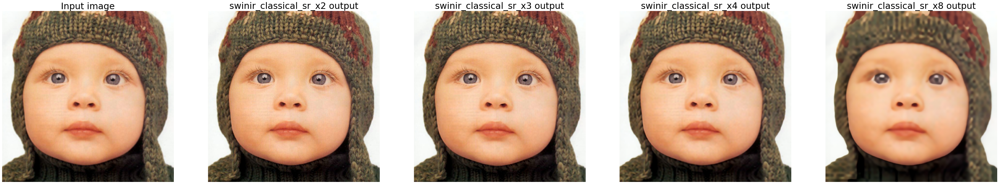

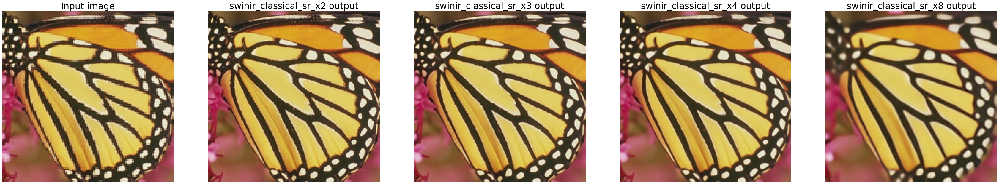

In [ ]:
display(input_image1, img_x21, img_x31, img_x41, img_x81)
display(input_image, img_x2, img_x3, img_x4, img_x8)

##Training using DIV2K + FLICKR2K dataset

Now train the model over DIV2K+Flickr2K using following steps

OPEN /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_classical.json




**MODIFY line 20-21** writing:


20:   "dataroot_H": "trainsets/trainH/DIV2K_FLICKR2K"


21:   "dataroot_L": "trainsets/trainL/DIV2K_LR_FLICKR2K"

In [ ]:
# 001 Classical Image SR (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_classical.json

##Testing using Set14 dataset

**MODIFY line 32-33** writing: 


Line 32: "dataroot_H": "testsets/Set14/original"

Line 33: "dataroot_L": "testsets/Set14/LRbicx2"

In [ ]:
# (model is trained on DIV2K+Flickr2K and with training_patch_size=64)
!python main_test_swinir.py --task classical_sr --scale 2 --training_patch_size 64 --model_path model_zoo/swinir/001_classicalSR_DF2K_s64w8_SwinIR-M_x2.pth --folder_lq testsets/Set14/LRbicx2 --folder_gt testsets/Set14/original
!python main_test_swinir.py --task classical_sr --scale 3 --training_patch_size 64 --model_path model_zoo/swinir/001_classicalSR_DF2K_s64w8_SwinIR-M_x3.pth --folder_lq testsets/Set14/LRbicx3 --folder_gt testsets/Set14/original
!python main_test_swinir.py --task classical_sr --scale 4 --training_patch_size 64 --model_path model_zoo/swinir/001_classicalSR_DF2K_s64w8_SwinIR-M_x4.pth --folder_lq testsets/Set14/LRbicx4 --folder_gt testsets/Set14/original


loading model from model_zoo/swinir/001_classicalSR_DF2K_s64w8_SwinIR-M_x2.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 baboon               - PSNR: 24.36 dB; SSIM: 0.7552; PSNR_Y: 26.76 dB; SSIM_Y: 0.8108; PSNR_B: 0.00 dB.
Testing 1 barbara              - PSNR: 29.82 dB; SSIM: 0.9124; PSNR_Y: 31.55 dB; SSIM_Y: 0.9306; PSNR_B: 0.00 dB.
Testing 2 bridge               - PSNR: 28.33 dB; SSIM: 0.8657; PSNR_Y: 29.65 dB; SSIM_Y: 0.8728; PSNR_B: 0.00 dB.
Testing 3 coastguard           - PSNR: 30.15 dB; SSIM: 0.8485; PSNR_Y: 31.49 dB; SSIM_Y: 0.8602; PSNR_B: 0.00 dB.
Testing 4 comic                - PSNR: 29.37 dB; SSIM: 0.9458; PSNR_Y: 30.88 dB; SSIM_Y: 0.9520; PSNR_B: 0.00 dB.
Testing 5 face                 - PSNR: 

##Results visualization

In [ ]:
def displayc(img1, img2, img3, img4):
  total_figs = 4
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_classical_sr_x2 output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('swinir_classical_sr_x3 output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('swinir_classical_sr_x4 output', fontsize=30)
  ax4.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)

In [ ]:
input_img_pathc = "/content/drive/MyDrive/SwinIR_project/testsets/Set14/LRbicx2/flowersx2.png"
input_imagec = io.imread(input_img_pathc)

img_x2_pathc = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x2/flowers_SwinIR.png"
img_x2c = io.imread(img_x2_pathc)

img_x3_pathc = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x3/flowers_SwinIR.png"
img_x3c = io.imread(img_x3_pathc)

img_x4_pathc = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x4/flowers_SwinIR.png"
img_x4c = io.imread(img_x4_pathc)

####################################################################
input_img_pathc1 = "/content/drive/MyDrive/SwinIR_project/testsets/Set14/LRbicx2/foremanx2.png"
input_imagec1 = io.imread(input_img_pathc1)

img_x2_pathc1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x2/foreman_SwinIR.png"
img_x2c1 = io.imread(img_x2_pathc1)

img_x3_pathc1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x3/foreman_SwinIR.png"
img_x3c1 = io.imread(img_x3_pathc1)

img_x4_pathc1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_classical_sr_x4/foreman_SwinIR.png"
img_x4c1 = io.imread(img_x4_pathc1)

In [ ]:
displayc(input_imagec1, img_x2c1, img_x3c1, img_x4c1)
displayc(input_imagec, img_x2c, img_x3c, img_x4c)

Output hidden; open in https://colab.research.google.com to view.

You can also do testing using **other datasets** already downloaded in the Google Drive folder

You need only to **change** the .json file in /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_classical.json


**Modify** line 32-33, i.e. **the paths of H and L testing datasets** with the new ones and also remember to **change the image paths in the 3 cells above**

**This is valid for all the tasks**

#TASK2: Lightweight Image SR (small size)

Before train the model using DIV2K dataset, open the file at /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_lightweight.json

and check if line 20-21 are the following:

Line 20:  "dataroot_H": "trainsets/trainH/DIV2K/DIV2K_train_HR"


Line 21:  "dataroot_L": "trainsets/trainL/DIV2K_train_LR_bicubic/X2" 

##Training using DIV2K dataset

In [ ]:
# 002 Lightweight Image SR (small size)
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_lightweight.json

export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7
number of GPUs is: 8
LogHandlers setup!
22-08-25 09:05:43.189 :   task: swinir_sr_lightweight_x2
  model: plain
  gpu_ids: [0, 1, 2, 3, 4, 5, 6, 7]
  dist: False
  scale: 2
  n_channels: 3
  path:[
    root: superresolution
    pretrained_netG: None
    pretrained_netE: None
    task: superresolution/swinir_sr_lightweight_x2
    log: superresolution/swinir_sr_lightweight_x2
    options: superresolution/swinir_sr_lightweight_x2/options
    models: superresolution/swinir_sr_lightweight_x2/models
    images: superresolution/swinir_sr_lightweight_x2/images
    pretrained_optimizerG: None
  ]
  datasets:[
    train:[
      name: train_dataset
      dataset_type: sr
      dataroot_H: trainsets/trainH/DIV2K/DIV2K_train_HR
      dataroot_L: trainsets/trainL/DIV2K_train_LR_bicubic/X2
      H_size: 128
      dataloader_shuffle: True
      dataloader_num_workers: 16
      dataloader_batch_size: 1
      phase: train
      scale: 2
      n_channels: 3
   

##Testing using Set5 dataset

In [ ]:
# 002 Lightweight Image Super-Resolution (small size)
!python main_test_swinir.py --task lightweight_sr --scale 2 --model_path model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x2.pth --folder_lq testsets/Set5/Set5/LRbicx2 --folder_gt testsets/Set5/Set5/original
!python main_test_swinir.py --task lightweight_sr --scale 3 --model_path model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x3.pth --folder_lq testsets/Set5/Set5/LRbicx3 --folder_gt testsets/Set5/Set5/original
!python main_test_swinir.py --task lightweight_sr --scale 4 --model_path model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x4.pth --folder_lq testsets/Set5/Set5/LRbicx4 --folder_gt testsets/Set5/Set5/original

loading model from model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x2.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 baby                 - PSNR: 37.40 dB; SSIM: 0.9603; PSNR_Y: 38.94 dB; SSIM_Y: 0.9681; PSNR_B: 0.00 dB.
Testing 1 bird                 - PSNR: 40.59 dB; SSIM: 0.9841; PSNR_Y: 43.28 dB; SSIM_Y: 0.9906; PSNR_B: 0.00 dB.
Testing 2 butterfly            - PSNR: 34.13 dB; SSIM: 0.9718; PSNR_Y: 35.75 dB; SSIM_Y: 0.9795; PSNR_B: 0.00 dB.
Testing 3 head                 - PSNR: 32.32 dB; SSIM: 0.8345; PSNR_Y: 36.07 dB; SSIM_Y: 0.8922; PSNR_B: 0.00 dB.
Testing 4 woman                - PSNR: 35.28 dB; SSIM: 0.9716; PSNR_Y: 36.65 dB; SSIM_Y: 0.9752; PSNR_B: 0.00 dB.

results/swinir_lightweight_sr_x2 
-

##Results visualization

In [ ]:
def displayLightWeight(img1, img2, img3, img4):
  total_figs = 4
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_lightweight_sr_x2 output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('swinir_lightweight_sr_x3 output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('swinir_lightweight_sr_x4 output', fontsize=30)
  ax4.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)

In [ ]:
input_img_pathl = "/content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/butterflyx2.png"
input_imagel = io.imread(input_img_pathl)

img_x2_pathl = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x2/butterfly_SwinIR.png"
img_x2l = io.imread(img_x2_pathl)

img_x3_pathl = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x3/butterfly_SwinIR.png"
img_x3l = io.imread(img_x3_pathl)

img_x4_pathl = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x4/butterfly_SwinIR.png"
img_x4l = io.imread(img_x4_pathl)

####################################################################

input_img_pathl1 = "/content/drive/MyDrive/SwinIR_project/testsets/Set5/Set5/LRbicx2/womanx2.png"
input_imagel1 = io.imread(input_img_pathl1)

img_x2_pathl1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x2/woman_SwinIR.png"
img_x2l1 = io.imread(img_x2_pathl1)

img_x3_pathl1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x3/woman_SwinIR.png"
img_x3l1 = io.imread(img_x3_pathl1)

img_x4_pathl1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x4/woman_SwinIR.png"
img_x4l1 = io.imread(img_x4_pathl1)


In [ ]:
displayLightWeight(input_imagel1, img_x2l1, img_x3l1, img_x4l1)
displayLightWeight(input_imagel, img_x2l, img_x3l, img_x4l)

Output hidden; open in https://colab.research.google.com to view.

##Training using DIV2K + FLICKR2K dataset

Now train the model over DIV2K+Flickr2K using following steps

OPEN /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_lightweight.json




**MODIFY line 20-21** writing:


20:   "dataroot_H": "trainsets/trainH/DIV2K_FLICKR2K"


21:   "dataroot_L": "trainsets/trainL/DIV2K_LR_FLICKR2K"

In [ ]:
# 002 Lightweight Image SR (small size)
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_lightweight.json

export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7
number of GPUs is: 8
LogHandlers setup!
22-08-30 09:32:47.555 :   task: swinir_sr_lightweight_x2
  model: plain
  gpu_ids: [0, 1, 2, 3, 4, 5, 6, 7]
  dist: False
  scale: 2
  n_channels: 3
  path:[
    root: superresolution
    pretrained_netG: superresolution/swinir_sr_lightweight_x2/models/45000_G.pth
    pretrained_netE: superresolution/swinir_sr_lightweight_x2/models/45000_E.pth
    task: superresolution/swinir_sr_lightweight_x2
    log: superresolution/swinir_sr_lightweight_x2
    options: superresolution/swinir_sr_lightweight_x2/options
    models: superresolution/swinir_sr_lightweight_x2/models
    images: superresolution/swinir_sr_lightweight_x2/images
    pretrained_optimizerG: superresolution/swinir_sr_lightweight_x2/models/45000_optimizerG.pth
  ]
  datasets:[
    train:[
      name: train_dataset
      dataset_type: sr
      dataroot_H: trainsets/trainH/DIV2K_FLICKR2K
      dataroot_L: trainsets/trainL/DIV2K_LR_FLICKR2K
      H_si

##Testing using Set14 dataset

**MODIFY line 32-33** writing: 


Line 32: "dataroot_H": "testsets/Set14/original"

Line 33: "dataroot_L": "testsets/Set14/LRbicx2"

In [ ]:
# (model is trained on DIV2K+Flickr2K)
!python main_test_swinir.py --task lightweight_sr --scale 2 --model_path model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x2.pth --folder_lq testsets/Set14/LRbicx2 --folder_gt testsets/Set14/original
!python main_test_swinir.py --task lightweight_sr --scale 3 --model_path model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x3.pth --folder_lq testsets/Set14/LRbicx3 --folder_gt testsets/Set14/original
!python main_test_swinir.py --task lightweight_sr --scale 4 --model_path model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x4.pth --folder_lq testsets/Set14/LRbicx4 --folder_gt testsets/Set14/original


loading model from model_zoo/swinir/002_lightweightSR_DIV2K_s64w8_SwinIR-S_x2.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 baboon               - PSNR: 24.21 dB; SSIM: 0.7484; PSNR_Y: 26.59 dB; SSIM_Y: 0.8044; PSNR_B: 0.00 dB.
Testing 1 barbara              - PSNR: 28.21 dB; SSIM: 0.8874; PSNR_Y: 29.81 dB; SSIM_Y: 0.9057; PSNR_B: 0.00 dB.
Testing 2 bridge               - PSNR: 28.21 dB; SSIM: 0.8630; PSNR_Y: 29.54 dB; SSIM_Y: 0.8702; PSNR_B: 0.00 dB.
Testing 3 coastguard           - PSNR: 29.78 dB; SSIM: 0.8405; PSNR_Y: 31.12 dB; SSIM_Y: 0.8528; PSNR_B: 0.00 dB.
Testing 4 comic                - PSNR: 28.89 dB; SSIM: 0.9401; PSNR_Y: 30.38 dB; SSIM_Y: 0.9466; PSNR_B: 0.00 dB.
Testing 5 face                 - PSN

##Results visualization

In [ ]:
input_img_pathlw = "/content/drive/MyDrive/SwinIR_project/testsets/Set14/LRbicx2/barbarax2.png"
input_imagelw = io.imread(input_img_pathlw)

img_x2_pathlw = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x2/barbara_SwinIR.png"
img_x2lw = io.imread(img_x2_pathlw)

img_x3_pathlw = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x3/barbara_SwinIR.png"
img_x3lw = io.imread(img_x3_pathlw)

img_x4_pathlw = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x4/barbara_SwinIR.png"
img_x4lw = io.imread(img_x4_pathlw)

####################################################################
input_img_pathlw1 = "/content/drive/MyDrive/SwinIR_project/testsets/Set14/LRbicx2/zebrax2.png"
input_imagelw1 = io.imread(input_img_pathlw1)

img_x2_pathlw1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x2/zebra_SwinIR.png"
img_x2lw1 = io.imread(img_x2_pathlw1)

img_x3_pathlw1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x3/zebra_SwinIR.png"
img_x3lw1 = io.imread(img_x3_pathlw1)

img_x4_pathlw1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_lightweight_sr_x4/zebra_SwinIR.png"
img_x4lw1 = io.imread(img_x4_pathlw1)

In [ ]:
displayLightWeight(input_imagelw1, img_x2lw1, img_x3lw1, img_x4lw1)
displayLightWeight(input_imagelw, img_x2lw, img_x3lw, img_x4lw)

Output hidden; open in https://colab.research.google.com to view.

You can also do testing using **other datasets** already downloaded in the Google Drive folder

You need only to **change** the .json file in /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_lightweight.json


**Modify** line 32-33, i.e. **the paths of H and L testing datasets** with the new ones and also remember to **change the image paths in the 3 cells above**

**This is valid for all the tasks**

#TASK3: Real-World Image SR

**Dataset for training:**  

DIV2K (900 training images) + Flickr2K (2650 images) + OST (10324 images for sky,water,grass,mountain,building,plant,animal) --->  **Middle Size**


DIV2K + Flickr2K + OST + FFHQ (2000 images) + Manga109 + SCUT-CTW1500 (1000 training images) ---> **Large Size**

############################

**Dataset for testing:** 

RealSRSet+5images

Before train the model using DIV_FLICKR_OST dataset, open the file at /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_realworld_x4_gan.json

and at /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_realworld_x4_psnr.json

and check if line 20 is:

Line 20:  "dataroot_H": "trainsets/trainH/DIV_FLICKR_OST"


##Training using DIV_FLICKR_OST (middle size)

In [ ]:
# 003 Real-World Image SR (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_realworld_x4_psnr.json

In [ ]:
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_realworld_x4_gan.json

export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7
number of GPUs is: 8
LogHandlers setup!
22-08-26 10:31:11.739 :   task: swinir_sr_realworld_x4_gan
  model: gan
  gpu_ids: [0, 1, 2, 3, 4, 5, 6, 7]
  scale: 4
  n_channels: 3
  path:[
    root: superresolution
    pretrained_netG: None
    pretrained_netD: None
    pretrained_netE: None
    task: superresolution/swinir_sr_realworld_x4_gan
    log: superresolution/swinir_sr_realworld_x4_gan
    options: superresolution/swinir_sr_realworld_x4_gan/options
    models: superresolution/swinir_sr_realworld_x4_gan/models
    images: superresolution/swinir_sr_realworld_x4_gan/images
    pretrained_optimizerG: None
  ]
  datasets:[
    train:[
      name: train_dataset
      dataset_type: blindsr
      dataroot_H: trainsets/trainH/DIV_FLICKR_OST
      dataroot_L: None
      degradation_type: bsrgan
      H_size: 256
      shuffle_prob: 0.1
      lq_patchsize: 64
      use_sharp: True
      dataloader_shuffle: True
      dataloader_num_workers: 16
     

##Testing using RealSRSet+5images (middle size)

In [ ]:
# 003 Real-World Image Super-Resolution (middle size)
!python main_test_swinir.py --task real_sr --scale 4 --model_path model_zoo/swinir/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth --folder_lq testsets/RealSRSet_5images

loading model from model_zoo/swinir/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 00003               
Testing 1 0014                
Testing 2 0030                
Testing 3 ADE_val_00000114    
Testing 4 Lincoln             
Testing 5 OST_009             
Testing 6 building            
Testing 7 butterfly           
Testing 8 butterfly2          
Testing 9 chip                
Testing 10 comic1              
Testing 11 comic2              
Testing 12 comic3              
Testing 13 computer            
Testing 14 dog                 
Testing 15 dped_crop00061      
Testing 16 foreman             
Testing 17 frog                
Testing 18 oldphoto2           
Testin

##Results visualization

In [ ]:
def displayr(img1, img2):
  total_figs = 2
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_realworld_sr output', fontsize=30)
  ax2.axis('off')
  
  ax1.imshow(img1)
  ax2.imshow(img2)

In [ ]:
input_img_pathr = "/content/drive/MyDrive/SwinIR_project/testsets/RealSRSet_5images/0014.jpg"
input_imagerm = io.imread(input_img_pathr)

img_pathr = "/content/drive/MyDrive/SwinIR_project/results/swinir_real_sr_x4/0014_SwinIR.png"
imgr = io.imread(img_pathr)

####################################################################
input_img_pathr1 = "/content/drive/MyDrive/SwinIR_project/testsets/RealSRSet_5images/oldphoto3.png"
input_imager1 = io.imread(input_img_pathr1)

img_pathr1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_real_sr_x4/oldphoto3_SwinIR.png"
imgr1 = io.imread(img_pathr1)

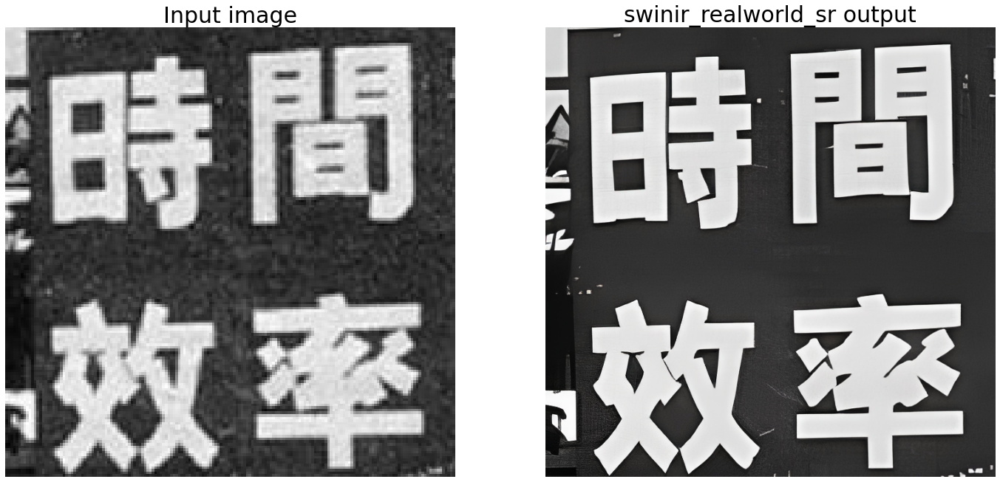

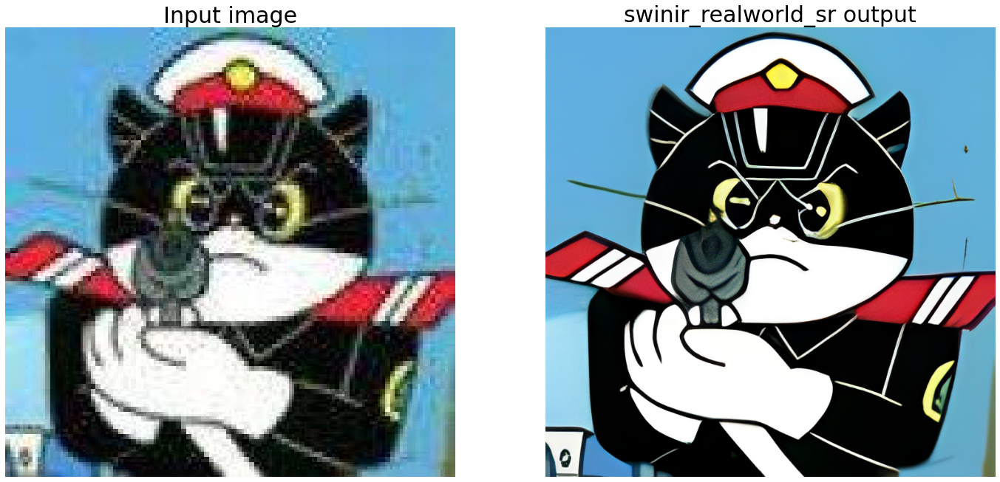

In [ ]:
displayr(input_imager1, imgr1)
displayr(input_imagerm, imgr)

##Training using DIV_FLICKR_OST_FFHQ_SCUT(large size)

Before train the model using DIV_FLICKR_OST dataset, open the file at /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_realworld_x4_gan.json

and at /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_sr_realworld_x4_psnr.json

and check if line 20 is:

Line 20:  "dataroot_H": "trainsets/trainH/DIV_FLICKR_OST_FFHQ_SCUT"


In [ ]:
# 003 Real-World Image SR (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_realworld_psnr.json

In [ ]:
!python main_train_psnr.py --opt options/swinir/train_swinir_sr_realworld_gan.json

##Testing using RealSRSet+5images (large size)

In [ ]:
# 003 Real-World Image Super-Resolution (use --tile 400 if you run out-of-memory)
# (larger size + trained on more datasets)
!python main_test_swinir.py --task real_sr --scale 4 --large_model --model_path model_zoo/swinir/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth --folder_lq testsets/RealSRSet_5images

downloading model model_zoo/swinir/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 00003               
Testing 1 0014                
Testing 2 0030                
Testing 3 ADE_val_00000114    
Testing 4 Lincoln             
Testing 5 OST_009             
Testing 6 building            
Testing 7 butterfly           
Testing 8 butterfly2          
Testing 9 chip                
Testing 10 comic1              
Testing 11 comic2              
Testing 12 comic3              
Testing 13 computer            
Testing 14 dog                 
Testing 15 dped_crop00061      
Testing 16 foreman             
Testing 17 frog                
Testing 18 oldphoto2           
Tes

##Results visualization

In [ ]:
input_img_pathrl = "/content/drive/MyDrive/SwinIR_project/testsets/RealSRSet_5images/dped_crop00061.png"
input_imagerl = io.imread(input_img_pathrl)

img_pathrl = "/content/drive/MyDrive/SwinIR_project/results/swinir_real_sr_x4_large/dped_crop00061_SwinIR.png"
imgrl = io.imread(img_pathrl)

####################################################################
input_img_pathrl1 = "/content/drive/MyDrive/SwinIR_project/testsets/RealSRSet_5images/oldphoto2.png"
input_imagerl1 = io.imread(input_img_pathrl1)

img_pathrl1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_real_sr_x4_large/oldphoto2_SwinIR.png"
imgrl1 = io.imread(img_pathrl1)

In [ ]:
displayr(input_imagerl1, imgrl1)
displayr(input_imagerl, imgrl)

Output hidden; open in https://colab.research.google.com to view.

##Comparison with other models

In [ ]:
# Clone realESRGAN
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

# Clone BSRGAN
!git clone https://github.com/cszn/BSRGAN.git

!rm -r SwinIR
# Clone SwinIR
!git clone https://github.com/JingyunLiang/SwinIR.git
!pip install timm

# Download the pre-trained models
!wget https://github.com/cszn/KAIR/releases/download/v1.0/BSRGAN.pth -P BSRGAN/model_zoo
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P experiments/pretrained_models
!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth -P experiments/pretrained_models
!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth -P experiments/pretrained_models

Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 682, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 682 (delta 4), reused 11 (delta 1), pack-reused 665
Receiving objects: 100% (682/682), 5.03 MiB | 3.08 MiB/s, done.
Resolving deltas: 100% (359/359), done.
/content/Real-ESRGAN
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 171 kB 13.4 MB/s 
     |████████████████████████████████| 5.9 MB 52.9 MB/s 
     |████████████████████████████████| 190 kB 50.1 MB/s 
  Created wheel for basicsr: filename=basicsr-1.4.1-py3-none-any.whl size=213764 sha256=51817d3df9603a3ca99ce6806a46f9a3881fc2d958781c52c9bea634a0f57d4c
  Stored in directory: /root/.cache/pip/wheels/36/c5/b3/dc9fdd1dc0f95e37ef35144686bfa374cb81985a38a8539ba0
Successfully built basicsr
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
running develop
running egg_info
creating realesrgan.egg-info
writing realesrgan.egg-info/PKG-INFO
writing dependency_links to realesrgan.egg-info/dependency_links.txt
writing requirements to realesrgan.egg-info/requires.txt
writing top-level names to realesrgan.egg-info/top_level.txt
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
adding license file 'LICENSE'
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
running build_ext
Creating /usr/local/lib/python3.7/dist-packages/realesrgan.egg-link (link to .)
Adding realesrgan 0.2.5.0 to easy-install.pth file

Installed /content/Real-ESRGAN
Processing dependencies for realesrgan==0.2.5.0
Searching for tqdm==4.64.0
Best match: tqdm 4.64.0
Adding tqdm 4.64.0 to easy-install.pth file
Installing tqdm script to /usr/local/bin

Using /usr/local/lib/python3.7/dist-packages
Searching for torchvis

In [ ]:
import os
import glob
from google.colab import files
import shutil

# test SwinIR by partioning the image into patches
test_patch_wise = False

# to be compatible with BSRGAN
!rm -r BSRGAN/testsets/RealSRSet
upload_folder = 'BSRGAN/testsets/RealSRSet'
result_folder = 'results'

if os.path.isdir(upload_folder):
    shutil.rmtree(upload_folder)
if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)
os.mkdir(upload_folder)
os.mkdir(result_folder)

# upload images
uploaded = files.upload()
for filename in uploaded.keys():
  dst_path = os.path.join(upload_folder, filename)
  print(f'move {filename} to {dst_path}')
  shutil.move(filename, dst_path)

Saving comic1.png to comic1.png
Saving dog.png to dog.png
Saving dped_crop00061.png to dped_crop00061.png
Saving Lincoln.png to Lincoln.png
move comic1.png to BSRGAN/testsets/RealSRSet/comic1.png
move dog.png to BSRGAN/testsets/RealSRSet/dog.png
move dped_crop00061.png to BSRGAN/testsets/RealSRSet/dped_crop00061.png
move Lincoln.png to BSRGAN/testsets/RealSRSet/Lincoln.png


In [ ]:
# BSRGAN
!rm -r results
if not test_patch_wise:
  %cd BSRGAN
  !python main_test_bsrgan.py
  %cd ..
  shutil.move('BSRGAN/testsets/RealSRSet_results_x4', 'results/BSRGAN')

# realESRGAN
if test_patch_wise:
  !python inference_realesrgan.py -n RealESRGAN_x4plus --input BSRGAN/testsets/RealSRSet -s 4 --output results/realESRGAN --tile 800
else:
  !python inference_realesrgan.py -n RealESRGAN_x4plus --input BSRGAN/testsets/RealSRSet -s 4 --output results/realESRGAN

# SwinIR
if test_patch_wise:
  !python SwinIR/main_test_swinir.py --task real_sr --model_path experiments/pretrained_models/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth --folder_lq BSRGAN/testsets/RealSRSet --scale 4 --tile 800
else:
  !python SwinIR/main_test_swinir.py --task real_sr --model_path experiments/pretrained_models/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth --folder_lq BSRGAN/testsets/RealSRSet --scale 4
shutil.move('results/swinir_real_sr_x4', 'results/SwinIR')

# SwinIR-Large
if test_patch_wise:
  !python SwinIR/main_test_swinir.py --task real_sr --model_path experiments/pretrained_models/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth --folder_lq BSRGAN/testsets/RealSRSet --scale 4 --large_model --tile 640
else:
  !python SwinIR/main_test_swinir.py --task real_sr --model_path experiments/pretrained_models/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth --folder_lq BSRGAN/testsets/RealSRSet --scale 4 --large_model
shutil.move('results/swinir_real_sr_x4_large', 'results/SwinIR_large')
for path in sorted(glob.glob(os.path.join('results/SwinIR_large', '*.png'))):
  os.rename(path, path.replace('SwinIR.png', 'SwinIR_large.png'))

/content/Real-ESRGAN/BSRGAN
LogHandlers setup!
22-08-26 09:00:38.565 :       Model Name : BSRGAN
22-08-26 09:00:38.571 :           GPU ID : 0
[3, 3, 64, 23, 32, 4]
22-08-26 09:00:43.449 :       Input Path : testsets/RealSRSet
22-08-26 09:00:43.449 :      Output Path : testsets/RealSRSet_results_x4
22-08-26 09:00:43.449 : ---1 --> BSRGAN --> x4--> Lincoln.png
22-08-26 09:00:49.953 : ---2 --> BSRGAN --> x4--> comic1.png
22-08-26 09:00:50.093 : ---3 --> BSRGAN --> x4--> dog.png
22-08-26 09:00:51.123 : ---4 --> BSRGAN --> x4--> dped_crop00061.png
/content/Real-ESRGAN
Testing 0 Lincoln
Testing 1 comic1
Testing 2 dog
Testing 3 dped_crop00061
loading model from experiments/pretrained_models/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshg

In [ ]:
# utils for visualization
import cv2
import matplotlib.pyplot as plt
def displayy(img1, img2):
  total_figs = 5
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('BSRGAN (ICCV2021) output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('Real-ESRGAN output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('SwinIR output', fontsize=30)
  ax4.axis('off')
  ax5 = fig.add_subplot(1, total_figs, 5)
  plt.title('SwinIR-Large output', fontsize=30)
  ax5.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2['BSRGAN'])
  ax3.imshow(img2['realESRGAN'])
  ax4.imshow(img2['SwinIR'])
  ax5.imshow(img2['SwinIR-L'])

def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

# display each image in the upload folder
print('Note: BSRGAN may be better at face restoration, but worse at building restoration because it uses different datasets in training.')
if test_patch_wise:
  print('BSRGAN does not support "test_patch_wise" mode for now. Set test_patch_wise = False to see its results.\n')
else:
  print('\n')
input_folder = upload_folder
result_folder = 'results/SwinIR'
input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
output_list = sorted(glob.glob(os.path.join(result_folder, '*')))
for input_path, output_path in zip(input_list, output_list):
  img_input = imread(input_path)
  img_output = {}
  img_output['SwinIR'] = imread(output_path)
  img_output['SwinIR-L'] = imread(output_path.replace('SwinIR/', 'SwinIR_large/').replace('SwinIR.png', 'SwinIR_large.png'))
  if test_patch_wise:
    img_output['BSRGAN'] = img_output['SwinIR']*0+255
  else:
    img_output['BSRGAN'] = imread(output_path.replace('SwinIR', 'BSRGAN'))
  path = output_path.replace('/SwinIR/', '/realESRGAN/').replace('_SwinIR.png','_out{}'.format(os.path.splitext(input_path)[1]))
  if os.path.exists(path):
    shutil.move(path, path.replace('_out.', '_realESRGAN.'))
  img_output['realESRGAN'] = imread(path.replace('_out.', '_realESRGAN.'))

  displayy(img_input, img_output)

Output hidden; open in https://colab.research.google.com to view.

#TASK4: Grayscale Image Denoising (middle size)

**Dataset for training:**  

DIV2K (900 training images) + Flickr2K (2650 images) + BSD500 (401 training&testing images) --->  **Middle Size**


############################

**Dataset for testing:** 

Set12

##Training

In [ ]:
# 004 Grayscale Image Denoising (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_denoising_gray.json

export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7
number of GPUs is: 8
LogHandlers setup!
22-08-27 10:09:17.582 :   task: swinir_denoising_gray_15
  model: plain
  gpu_ids: [0, 1, 2, 3, 4, 5, 6, 7]
  dist: False
  n_channels: 1
  path:[
    root: denoising
    pretrained_netG: None
    pretrained_netE: None
    task: denoising/swinir_denoising_gray_15
    log: denoising/swinir_denoising_gray_15
    options: denoising/swinir_denoising_gray_15/options
    models: denoising/swinir_denoising_gray_15/models
    images: denoising/swinir_denoising_gray_15/images
    pretrained_optimizerG: None
  ]
  datasets:[
    train:[
      name: train_dataset
      dataset_type: dncnn
      dataroot_H: trainsets/trainH/DIV_FLICKR_BSD
      dataroot_L: None
      H_size: 128
      sigma: 15
      sigma_test: 15
      dataloader_shuffle: True
      dataloader_num_workers: 16
      dataloader_batch_size: 1
      phase: train
      scale: 1
      n_channels: 1
    ]
    test:[
      name: test_dataset
      datase

##Testing

In [ ]:
# 004 Grayscale Image Denoising (middle size)
!python main_test_swinir.py --task gray_dn --noise 15 --model_path model_zoo/swinir/004_grayDN_DFWB_s128w8_SwinIR-M_noise15.pth --folder_gt testsets/Set12
!python main_test_swinir.py --task gray_dn --noise 25 --model_path model_zoo/swinir/004_grayDN_DFWB_s128w8_SwinIR-M_noise25.pth --folder_gt testsets/Set12
!python main_test_swinir.py --task gray_dn --noise 50 --model_path model_zoo/swinir/004_grayDN_DFWB_s128w8_SwinIR-M_noise50.pth --folder_gt testsets/Set12

loading model from model_zoo/swinir/004_grayDN_DFWB_s128w8_SwinIR-M_noise15.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 01                   - PSNR: 33.04 dB; SSIM: 0.9169; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 0.00 dB.
Testing 1 02                   - PSNR: 35.91 dB; SSIM: 0.9099; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 0.00 dB.
Testing 2 03                   - PSNR: 33.66 dB; SSIM: 0.9162; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 0.00 dB.
Testing 3 04                   - PSNR: 32.57 dB; SSIM: 0.9201; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 0.00 dB.
Testing 4 05                   - PSNR: 33.68 dB; SSIM: 0.9541; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 0.00 dB.
Testing 5 06                   - PSNR: 32.0

##Results visualization

In [ ]:
def displayg(img1, img2, img3, img4):
  total_figs = 4
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_image_denoising15 output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('swinir_image_denoising25 output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('swinir_image_denoising50 output', fontsize=30)
  ax4.axis('off')
  
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)

In [ ]:
input_img_pathg = "/content/drive/MyDrive/SwinIR_project/testsets/Set12/01.png"
input_imageg = io.imread(input_img_pathg)

img_path1g = "/content/drive/MyDrive/SwinIR_project/results/swinir_gray_dn_noise15/01_SwinIR.png"
imgg = io.imread(img_path1g)

img_path2g = "/content/drive/MyDrive/SwinIR_project/results/swinir_gray_dn_noise25/01_SwinIR.png"
img2g = io.imread(img_path2g)

img_path3g = "/content/drive/MyDrive/SwinIR_project/results/swinir_gray_dn_noise50/01_SwinIR.png"
img3g = io.imread(img_path3g)



####################################################################

input_img_pathg1 = "/content/drive/MyDrive/SwinIR_project/testsets/Set12/08.png"
input_imageg1 = io.imread(input_img_pathg1)

img_pathg1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_gray_dn_noise15/08_SwinIR.png"
imgg1 = io.imread(img_pathg1)

img_pathg12 = "/content/drive/MyDrive/SwinIR_project/results/swinir_gray_dn_noise25/08_SwinIR.png"
imgg12 = io.imread(img_pathg12)

img_pathg13 = "/content/drive/MyDrive/SwinIR_project/results/swinir_gray_dn_noise50/08_SwinIR.png"
imgg13 = io.imread(img_pathg13)

In [ ]:
displayg(input_imageg1, imgg1, imgg12, imgg13)
displayg(input_imageg, imgg, img2g, img3g)

Output hidden; open in https://colab.research.google.com to view.

You can also do testing using **other datasets** already downloaded in the Google Drive folder

You need only to **change** the .json file in /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_denoising_gray.json


**Modify** line 33, i.e. **the path of H testing dataset** with the new one and also remember to **change the image paths in the 3 cells above**

**This is valid for all the tasks**

#TASK5: Color Image Denoising (middle size)

**Dataset for training:**  

DIV2K (900 training images) + Flickr2K (2650 images) + BSD500 (401 training&testing images) --->  **Middle Size**


############################

**Dataset for testing:** 

McMaster

##Training

In [ ]:
# 005 Color Image Deoising (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_denoising_color.json

export CUDA_VISIBLE_DEVICES=0,1,2,3,4,5,6,7
number of GPUs is: 8
LogHandlers setup!
22-08-29 09:26:43.867 :   task: swinir_denoising_color_15
  model: plain
  gpu_ids: [0, 1, 2, 3, 4, 5, 6, 7]
  dist: False
  n_channels: 3
  path:[
    root: denoising
    pretrained_netG: None
    pretrained_netE: None
    task: denoising/swinir_denoising_color_15
    log: denoising/swinir_denoising_color_15
    options: denoising/swinir_denoising_color_15/options
    models: denoising/swinir_denoising_color_15/models
    images: denoising/swinir_denoising_color_15/images
    pretrained_optimizerG: None
  ]
  datasets:[
    train:[
      name: train_dataset
      dataset_type: dncnn
      dataroot_H: trainsets/trainH/DIV_FLICKR_BSD
      dataroot_L: None
      H_size: 128
      sigma: 15
      sigma_test: 15
      dataloader_shuffle: True
      dataloader_num_workers: 16
      dataloader_batch_size: 1
      phase: train
      scale: 1
      n_channels: 3
    ]
    test:[
      name: test_dataset
      

##Testing

In [ ]:
# 005 Color Image Deoising (middle size)
!python main_test_swinir.py --task color_dn --noise 15 --model_path model_zoo/swinir/005_colorDN_DFWB_s128w8_SwinIR-M_noise15.pth --folder_gt testsets/McMaster
!python main_test_swinir.py --task color_dn --noise 25 --model_path model_zoo/swinir/005_colorDN_DFWB_s128w8_SwinIR-M_noise25.pth --folder_gt testsets/McMaster
!python main_test_swinir.py --task color_dn --noise 50 --model_path model_zoo/swinir/005_colorDN_DFWB_s128w8_SwinIR-M_noise50.pth --folder_gt testsets/McMaster

downloading model model_zoo/swinir/005_colorDN_DFWB_s128w8_SwinIR-M_noise15.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 1                    - PSNR: 32.18 dB; SSIM: 0.9201; PSNR_Y: 35.05 dB; SSIM_Y: 0.9435; PSNR_B: 0.00 dB.
Testing 1 10                   - PSNR: 36.36 dB; SSIM: 0.9440; PSNR_Y: 39.46 dB; SSIM_Y: 0.9675; PSNR_B: 0.00 dB.
Testing 2 11                   - PSNR: 36.56 dB; SSIM: 0.9353; PSNR_Y: 38.85 dB; SSIM_Y: 0.9565; PSNR_B: 0.00 dB.
Testing 3 12                   - PSNR: 37.85 dB; SSIM: 0.9479; PSNR_Y: 40.72 dB; SSIM_Y: 0.9762; PSNR_B: 0.00 dB.
Testing 4 13                   - PSNR: 39.42 dB; SSIM: 0.9352; PSNR_Y: 43.45 dB; SSIM_Y: 0.9759; PSNR_B: 0.00 dB.
Testing 5 14                   - PSNR:

##Results visualization

In [ ]:
def displayd(img1, img2, img3, img4):
  total_figs = 4
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_image_denoising15_color output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('swinir_image_denoising25_color output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('swinir_image_denoising50_color output', fontsize=30)
  ax4.axis('off')
  
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)

In [ ]:
input_img_pathd = "/content/drive/MyDrive/SwinIR_project/testsets/McMaster/3.tif"
input_imaged = io.imread(input_img_pathd)

img_path1d = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_dn_noise15/3_SwinIR.png"
img1d = io.imread(img_path1d)

img_path2d = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_dn_noise25/3_SwinIR.png"
img2d = io.imread(img_path2d)

img_path3d = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_dn_noise50/3_SwinIR.png"
img3d = io.imread(img_path3d)

####################################################################

input_img_pathd1 = "/content/drive/MyDrive/SwinIR_project/testsets/McMaster/13.tif"
input_imaged1 = io.imread(input_img_pathd1)

img_pathd11 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_dn_noise15/13_SwinIR.png"
imgd11 = io.imread(img_pathd11)

img_pathd12 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_dn_noise25/13_SwinIR.png"
imgd12 = io.imread(img_pathd12)     

img_pathd13 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_dn_noise50/13_SwinIR.png"
imgd13 = io.imread(img_pathd13)

In [ ]:
displayd(input_imaged1, imgd11, imgd12, imgd13)
displayd(input_imaged, img1d, img2d, img3d)

Output hidden; open in https://colab.research.google.com to view.

You can also do testing using **other datasets** already downloaded in the Google Drive folder

You need only to **change** the .json file in /content/drive/MyDrive/SwinIR_project/options/swinir/train_swinir_denoising_color.json


**Modify** line 33, i.e. **the path of H testing dataset** with the new one and also remember to **change the image paths in the 3 cells above**

**This is valid for all the tasks**

#TASK6: JPEG compression artifact reduction (middle size)

**Dataset for training:**  

DIV2K (900 training images) + Flickr2K (2650 images) + BSD500 (401 training&testing images)

############################

**Dataset for testing:** 

LIVE1 ---> color images

classic5 ---> grayscale images

##Training

In [ ]:
# 006 JPEG Compression Artifact Reduction (middle size)
!python main_train_psnr.py --opt options/swinir/train_swinir_car_jpeg.json

##Testing (grayscale images)

In [ ]:
# 006 JPEG Compression Artifact Reduction (middle size, using window_size=7 because JPEG encoding uses 8x8 blocks)
!python main_test_swinir.py --task jpeg_car --jpeg 10 --model_path model_zoo/swinir/006_CAR_DFWB_s126w7_SwinIR-M_jpeg10.pth --folder_gt testsets/classic5
!python main_test_swinir.py --task jpeg_car --jpeg 20 --model_path model_zoo/swinir/006_CAR_DFWB_s126w7_SwinIR-M_jpeg20.pth --folder_gt testsets/classic5
!python main_test_swinir.py --task jpeg_car --jpeg 30 --model_path model_zoo/swinir/006_CAR_DFWB_s126w7_SwinIR-M_jpeg30.pth --folder_gt testsets/classic5
!python main_test_swinir.py --task jpeg_car --jpeg 40 --model_path model_zoo/swinir/006_CAR_DFWB_s126w7_SwinIR-M_jpeg40.pth --folder_gt testsets/classic5

loading model from model_zoo/swinir/006_CAR_DFWB_s126w7_SwinIR-M_jpeg10.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 baboon               - PSNR: 25.36 dB; SSIM: 0.7094; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 24.90 dB.
Testing 1 barbara              - PSNR: 29.81 dB; SSIM: 0.8712; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 29.35 dB.
Testing 2 boats                - PSNR: 30.29 dB; SSIM: 0.8186; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 30.04 dB.
Testing 3 lena                 - PSNR: 33.03 dB; SSIM: 0.8800; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 32.79 dB.
Testing 4 peppers              - PSNR: 32.85 dB; SSIM: 0.8452; PSNR_Y: 0.00 dB; SSIM_Y: 0.0000; PSNR_B: 32.67 dB.

results/swinir_jpeg_car_jpeg10 
-- Averag

##Testing (color images)

In [ ]:
!python main_test_swinir.py --task color_jpeg_car --jpeg 10 --model_path model_zoo/swinir/006_colorCAR_DFWB_s126w7_SwinIR-M_jpeg10.pth --folder_gt testsets/LIVE1
!python main_test_swinir.py --task color_jpeg_car --jpeg 20 --model_path model_zoo/swinir/006_colorCAR_DFWB_s126w7_SwinIR-M_jpeg20.pth --folder_gt testsets/LIVE1
!python main_test_swinir.py --task color_jpeg_car --jpeg 30 --model_path model_zoo/swinir/006_colorCAR_DFWB_s126w7_SwinIR-M_jpeg30.pth --folder_gt testsets/LIVE1
!python main_test_swinir.py --task color_jpeg_car --jpeg 40 --model_path model_zoo/swinir/006_colorCAR_DFWB_s126w7_SwinIR-M_jpeg40.pth --folder_gt testsets/LIVE1

loading model from model_zoo/swinir/006_colorCAR_DFWB_s126w7_SwinIR-M_jpeg10.pth
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Testing 0 bikes                - PSNR: 26.75 dB; SSIM: 0.8131; PSNR_Y: 28.95 dB; SSIM_Y: 0.8437; PSNR_B: 0.00 dB.
Testing 1 building2            - PSNR: 23.55 dB; SSIM: 0.7666; PSNR_Y: 25.59 dB; SSIM_Y: 0.8039; PSNR_B: 0.00 dB.
Testing 2 buildings            - PSNR: 26.52 dB; SSIM: 0.8292; PSNR_Y: 28.42 dB; SSIM_Y: 0.8532; PSNR_B: 0.00 dB.
Testing 3 caps                 - PSNR: 32.15 dB; SSIM: 0.8736; PSNR_Y: 34.53 dB; SSIM_Y: 0.9003; PSNR_B: 0.00 dB.
Testing 4 carnivaldolls        - PSNR: 28.22 dB; SSIM: 0.8627; PSNR_Y: 30.95 dB; SSIM_Y: 0.8939; PSNR_B: 0.00 dB.
Testing 5 cemetry              - PSNR

##Results visualization

In [ ]:
def displayj(img1, img2, img3, img4, img5):
  total_figs = 5
  fig = plt.figure(figsize=(total_figs*12, 14))
  ax1 = fig.add_subplot(1, total_figs, 1) 
  plt.title('Input image', fontsize=30)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, total_figs, 2)
  plt.title('swinir_jpeg_compression10 output', fontsize=30)
  ax2.axis('off')
  ax3 = fig.add_subplot(1, total_figs, 3)
  plt.title('swinir_jpeg_compression20 output', fontsize=30)
  ax3.axis('off')
  ax4 = fig.add_subplot(1, total_figs, 4)
  plt.title('swinir_jpeg_compression30 output', fontsize=30)
  ax4.axis('off')
  ax5 = fig.add_subplot(1, total_figs, 5)
  plt.title('swinir_jpeg_compression40 output', fontsize=30)
  ax5.axis('off')
  
  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)
  ax5.imshow(img5)

grayscale 

In [ ]:
input_img_pathjg = "/content/drive/MyDrive/SwinIR_project/testsets/classic5/lena.bmp"
input_imagejg = io.imread(input_img_pathjg)

img_pathjg = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg10/lena_SwinIR.png"
imgjg = io.imread(img_pathjg)

img_pathj1g = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg20/lena_SwinIR.png"
imgj1g = io.imread(img_pathj1g)

img_pathj2g = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg30/lena_SwinIR.png"
imgj2g = io.imread(img_pathj2g)

img_pathj3g = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg40/lena_SwinIR.png"
imgj3g = io.imread(img_pathj3g)

####################################################################

input_img_pathjg1 = "/content/drive/MyDrive/SwinIR_project/testsets/classic5/boats.bmp"
input_imagejg1 = io.imread(input_img_pathjg1)

img_pathjg1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg10/boats_SwinIR.png"
imgjg1 = io.imread(img_pathjg1)

img_pathjg2 = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg20/boats_SwinIR.png"
imgjg2 = io.imread(img_pathjg2)

img_pathjg3 = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg30/boats_SwinIR.png"
imgjg3 = io.imread(img_pathjg3)

img_pathjg4 = "/content/drive/MyDrive/SwinIR_project/results/swinir_jpeg_car_jpeg40/boats_SwinIR.png"
imgjg4 = io.imread(img_pathjg4)

color

In [ ]:
input_img_pathjc = "/content/drive/MyDrive/SwinIR_project/testsets/LIVE1/plane.bmp"
input_imagejc = io.imread(input_img_pathjc)

img_pathjc = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg10/plane_SwinIR.png"
imgjc = io.imread(img_pathjc)

img_pathj1c = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg20/plane_SwinIR.png"
imgj1c = io.imread(img_pathj1c)

img_pathj2c = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg30/plane_SwinIR.png"
imgj2c = io.imread(img_pathj2c)

img_pathj3c = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg40/plane_SwinIR.png"
imgj3c = io.imread(img_pathj3c)

####################################################################

input_img_pathjc1 = "/content/drive/MyDrive/SwinIR_project/testsets/LIVE1/sailing1.bmp"
input_imagejc1 = io.imread(input_img_pathjc1)

img_pathjc1 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg10/sailing1_SwinIR.png"
imgjc1 = io.imread(img_pathjc1)

img_pathjc2 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg20/sailing1_SwinIR.png"
imgjc2 = io.imread(img_pathjc2)

img_pathjc3 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg30/sailing1_SwinIR.png"
imgjc3 = io.imread(img_pathjc3)

img_pathjc4 = "/content/drive/MyDrive/SwinIR_project/results/swinir_color_jpeg_car_jpeg40/sailing1_SwinIR.png"
imgjc4 = io.imread(img_pathjc4)

In [ ]:
displayj(input_imagejg1, imgjg1, imgjg2, imgjg3, imgjg4)
displayj(input_imagejg, imgjg, imgj1g, imgj2g, imgj3g)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
displayj(input_imagejc1, imgjc1, imgjc2, imgjc3, imgjc4)
displayj(input_imagejc, imgjc, imgj1c, imgj2c, imgj3c)

Output hidden; open in https://colab.research.google.com to view.

#Final results

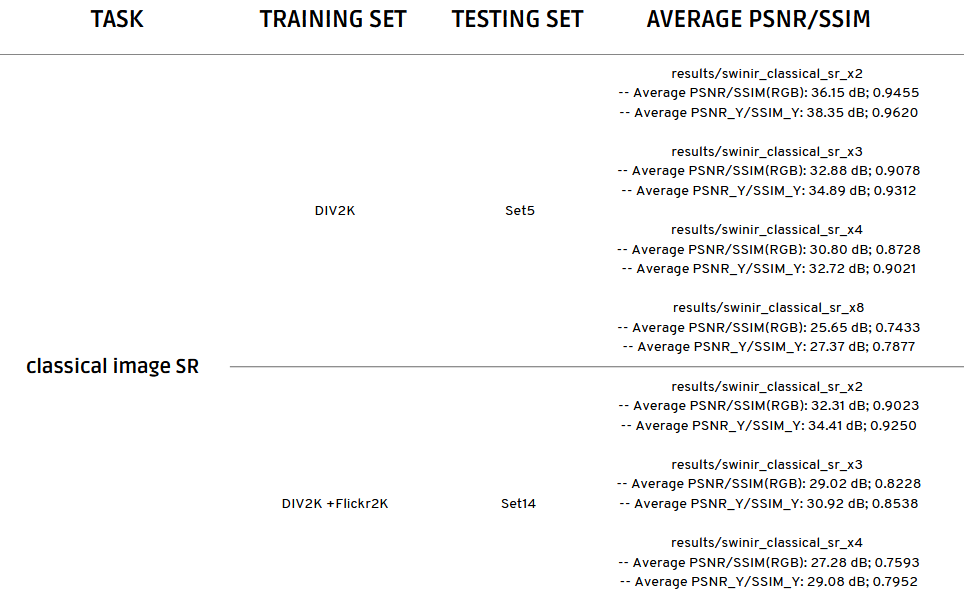

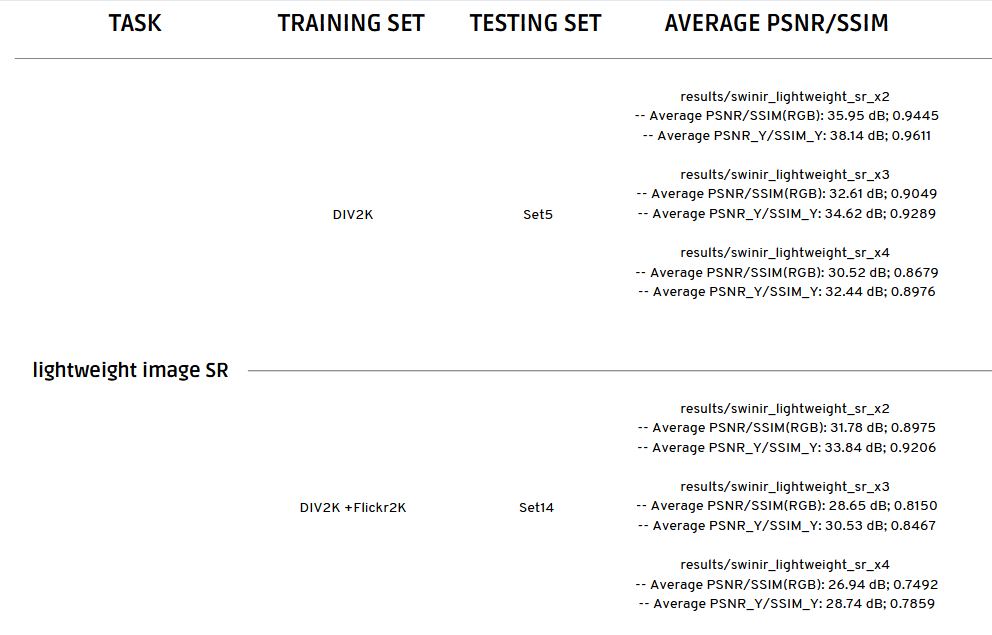

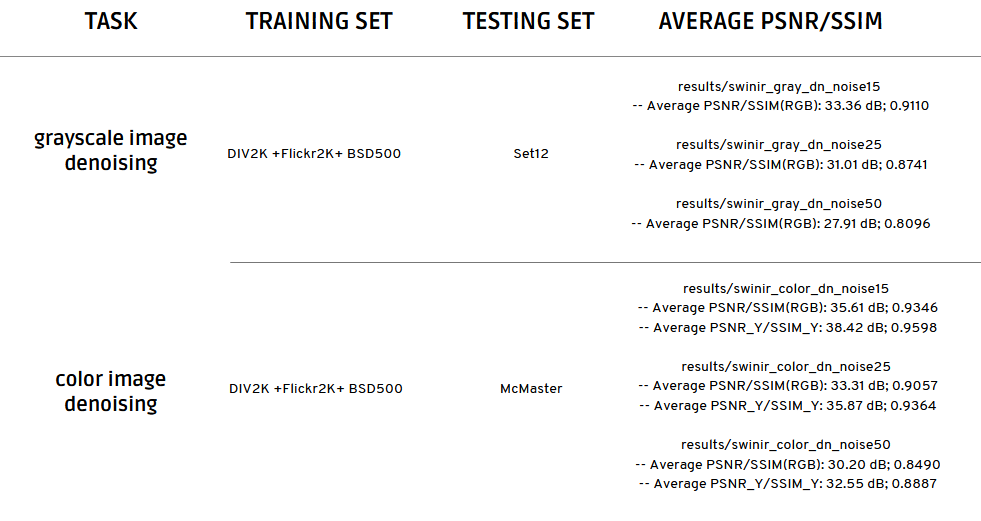

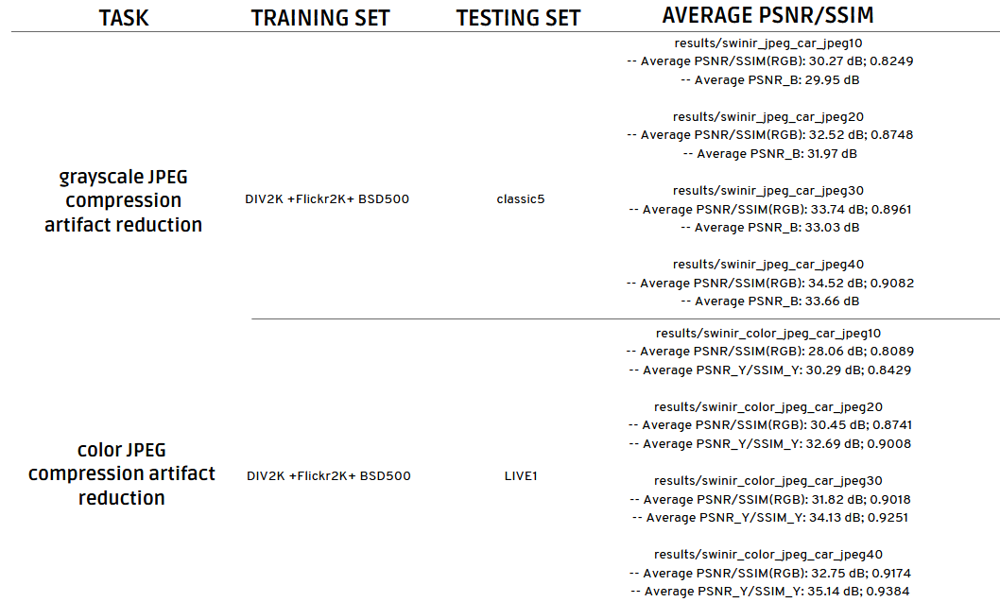